### GEO1001.2020 Resit Assignment 02
Classification of a Sentinel-2 image

**SURNAME:** Poon  
**NAME:** Chris  
**STUDENT ID:** 4395538  
**STUDY PROGRAMME:** MSc Geomatics

The aim of this assignment is to implement in Python a program that classifies a Sentinel-2 image. For the classification the k-means clustering method is used. The image that needs to be classified is downloaded from the official Copernicus Open Access Hub. This image covers a part of Iceland and only the 60m resolution is necessary for this assignment.

**Image details**
- Product Name: S2A_MSIL2A_20201013T125311_N0214_R138_T28WDT_20201013T152205
- UUID: 570081ea-2a4d-4054-805a-da5ac2d10633
- Creation date: 13/Oct/2020 20:05:39.000
- Size: 787.58 MB (Compressed : 1.05 GB)
- Instrument short name: MSI
- Platform name: Sentinel-2
- Processing level: LEVEL-1C
- Product type S2MSI1C
- Product Status: Online

- Platform name : Sentinel-2
- Platform NSSDC identifier : 2017-013A
- Platform serial identifier : 2B
- Platform short name : S2

- Instrument name : Multi-Spectral Instrument
- Instrument short name : MSI

- Sensor operational mode : INS-NOBS
- Sensor type : OPTICAL

- Processing date : 2020-10-28T13:14:36.000Z
- Processing level : LEVEL-1C
 
Acquisition
- Begin position : 28/Oct/2020 12:53:09.025
- End position : 28/Oct/2020 12:53:09.025

- Orbit direction : DESCENDING
- Orbit number : 19040
- Relative orbit number : 138

Ground Information
- Footprint : POLYGON ((-21.000427 64.3875721000313, -20.934021 64.47264514015195, -20.819458 64.61442494592825, -20.705475 64.756514093668, -20.590637 64.8985650969313, -20.572357 64.92080604067141, -18.679749 64.90607241707536, -18.761505 63.92156040544327, -21.000397 63.93884929376403, -21.000427 64.3875721000313))

Quality
- Cloud cover percentage : 2.4203

Other
- Filename : S2B_MSIL1C_20201028T125309_N0209_R138_T27WWM_20201028T131436.SAFE
- Format : SAFE
- Product type : S2MSI1C

In [1]:
#import required packages/modules
import rasterio as rio
from rasterio.plot import show
from sklearn import cluster
from matplotlib import pyplot as plt
from matplotlib import colors
import numpy as np
from scipy import stats
import pandas as pd
from kneed import KneeLocator

In [2]:
#k-means classification function
def kmeans(bands,n):
    imgxyb = np.empty((bands[0].height, bands[0].width, len(bands)), bands[0].meta['dtype'])
    
    for i in range(len(bands)):
        imgxyb[:,:,i] = bands[i].read()
    
    img1d = imgxyb.reshape((imgxyb.shape[0]*imgxyb.shape[1],imgxyb.shape[2]))
    cl = cluster.KMeans(n_clusters=n) 
    param = cl.fit(img1d) 
    img_cl = cl.labels_ 
    img_cl = img_cl.reshape(imgxyb[:,:,0].shape)
    return img_cl

The above function (kmeans()) will be used to perform the k-means classification.

In [3]:
#load images
path = './S2A_MSIL2A_20201013T125311_N0214_R138_T28WDT_20201013T152205.SAFE/GRANULE/L2A_T28WDT_A027734_20201013T125308/IMG_DATA/R60m/T28WDT_20201013T125311_'
B01 = rio.open(path + 'B01_60m.jp2')
B02 = rio.open(path + 'B02_60m.jp2')
B03 = rio.open(path + 'B03_60m.jp2')
B04 = rio.open(path + 'B04_60m.jp2')
B05 = rio.open(path + 'B05_60m.jp2')
B06 = rio.open(path + 'B06_60m.jp2')
B07 = rio.open(path + 'B07_60m.jp2')
B8A = rio.open(path + 'B8A_60m.jp2')
B09 = rio.open(path + 'B09_60m.jp2')
B11 = rio.open(path + 'B11_60m.jp2')
B12 = rio.open(path + 'B12_60m.jp2')

TCI = rio.open(path + 'TCI_60m.jp2')

The downloaded image of the chosen part of Iceland has 11 bands, included with these bands is a TCI (True Color Image) of this area of Iceland.
Since I am not familiar with any areas of Iceland, this TCI serves as a "check" to see if the different classes resulting from the k-means classification function represent one type of land cover each (for example: one for snow, one for water etc.).
See the figure below for the TCI.

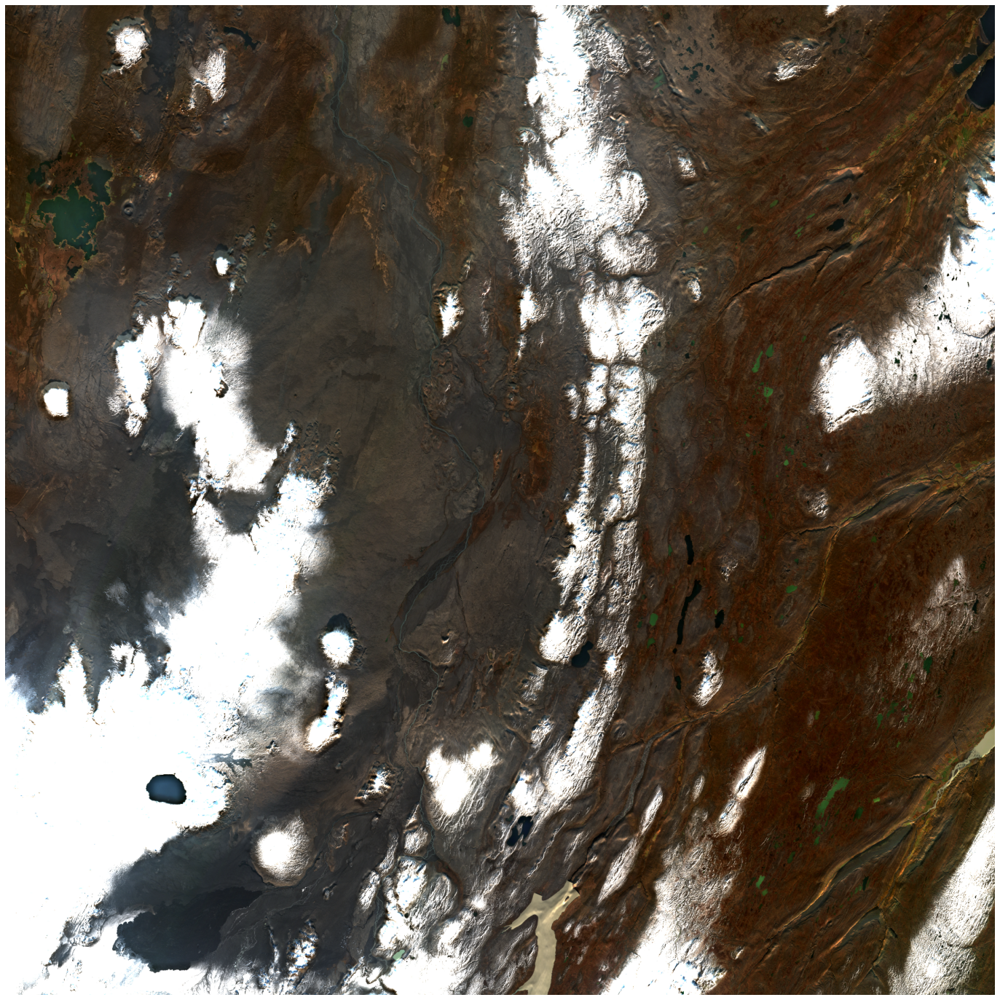

In [4]:
fig, ax = plt.subplots(1, figsize=(25, 25))
show(TCI, ax=ax)
ax.axis('off')
plt.show()

### First classification

The TCI shows 5 distinct colors:
1. White - snow
2. (Greenish) blue - water
3. Greyish brown - land
4. Dark brownish red - some type of vegetation
5. Sand color - land?

So for the first classification I have decided to use all 11 bands and 3 to 6 clusters. Since there are 5 distinctive colors observed from the TCI and it is suspected there are 4 types of land cover, 3 and 6 clusters are also used to see the effect of adding/subtracting a cluster. 

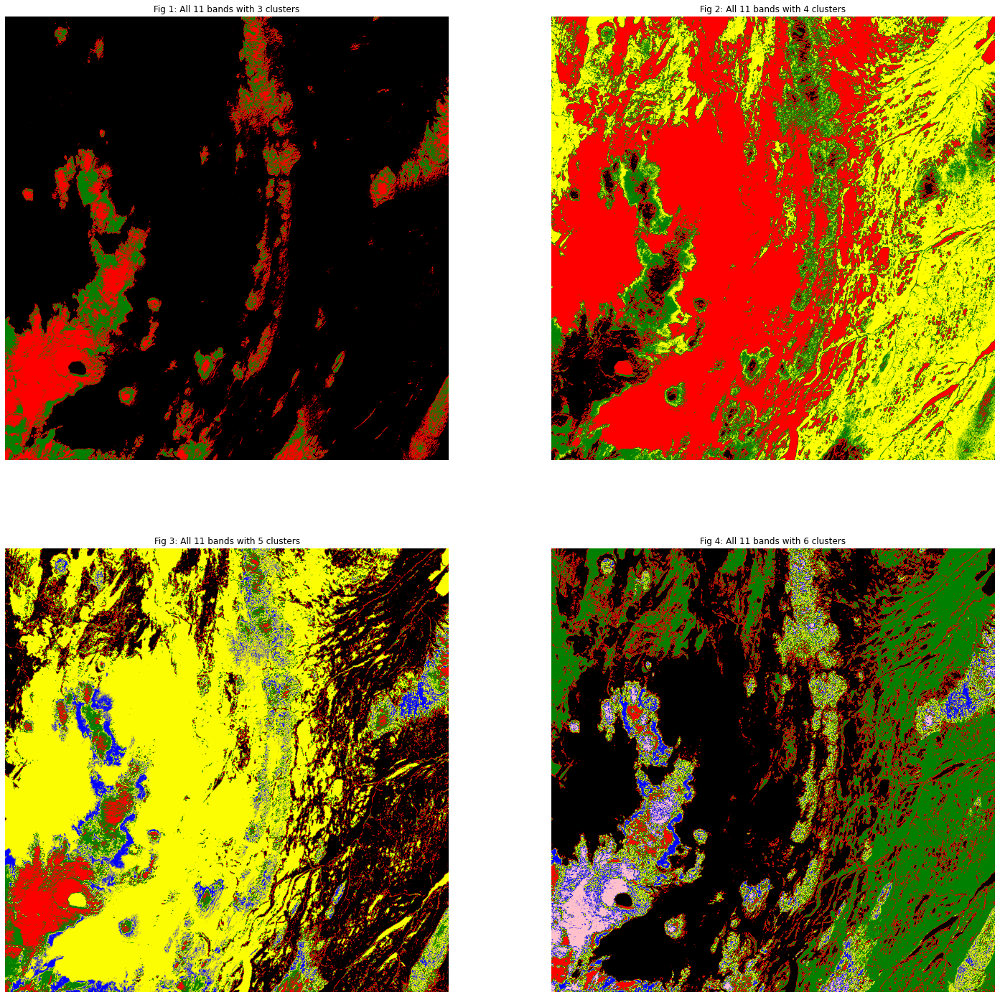

In [5]:
all_bands = [B01, B02, B03, B04, B05, B06, B07, B8A, B09, B11, B12]

img_cl1 = kmeans(all_bands,3)
img_cl2 = kmeans(all_bands,4)
img_cl3 = kmeans(all_bands,5)
img_cl4 = kmeans(all_bands,6)

cmap1 = colors.LinearSegmentedColormap.from_list("", ["black","red","green"])
cmap2 = colors.LinearSegmentedColormap.from_list("", ["black","red","green","yellow"])
cmap3 = colors.LinearSegmentedColormap.from_list("", ["black","red","green","yellow","blue"])
cmap4 = colors.LinearSegmentedColormap.from_list("", ["black","red","green","yellow","blue","pink"])

fig = plt.figure(figsize=[25,25])
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)

ax1.imshow(img_cl1,cmap=cmap1)
ax1.set_title('Fig 1: All 11 bands with 3 clusters')
ax2.imshow(img_cl2,cmap=cmap2)
ax2.set_title('Fig 2: All 11 bands with 4 clusters')
ax3.imshow(img_cl3,cmap=cmap3)
ax3.set_title('Fig 3: All 11 bands with 5 clusters')
ax4.imshow(img_cl4,cmap=cmap4)
ax4.set_title('Fig 4: All 11 bands with 6 clusters')

ax1.axis('off')
ax2.axis('off')
ax3.axis('off')
ax4.axis('off')

plt.show()

### First classification results

Figure 1 has 3 clusters. The snow has been clustered into two classes. While the water, greyish brown and dark brownish red (in the TCI) are all clustered into one class. 


In Figure 2, which has 4 clusters, the classification is a little bit better. The classifier made a distinction between the greyish brown and the dark brownish red, but the snow is still divided into multiple classes. The snow has been classified similarly to figure 1, but now the edges of the snow has been clustered to the same class as the dark brownish red from the TCI.

In Figure 3 and 4, which has 5 and 6 clusters respectively, the snow, greyish brown and dark brownish red from the TCI are subdivided into more classes. But there is still no distinctive class for the water.

In all 4 results of classification the snow has not been clustered into one class, also a distinction for the sand colored land cover from the TCI has not been made. In order to improve the results from the classification a smaller selection of bands used for the classification needs to be made, instead of using all 11 bands. To make this selection of bands a correlation matrix has been made, since bands which have a high correlation with each other have a high level of data redunancy.

In [6]:
all_bandsnames = ['B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B8A', 'B09', 'B11', 'B12']

matrix = []
for i in all_bands:
    row = []
    for j in all_bands:
        pears = stats.pearsonr(i.read()[0].flatten(),j.read()[0].flatten())[0]
        pears = round(ndigits=2, number=pears)
        row.append(pears)
    
    matrix.append(row)
    
pd.DataFrame(matrix, columns=all_bandsnames, index=all_bandsnames)

,B01,B02,B03,B04,B05,B06,B07,B8A,B09,B11,B12
B01,1.00,0.99,0.99,0.97,0.96,0.94,0.91,0.86,0.82,-0.48,-0.50
B02,0.99,1.00,1.00,0.99,0.98,0.96,0.94,0.89,0.84,-0.45,-0.46
B03,0.99,1.00,1.00,1.00,0.99,0.97,0.95,0.91,0.87,-0.41,-0.43
B04,0.97,0.99,1.00,1.00,1.00,0.98,0.97,0.93,0.89,-0.37,-0.38
B05,0.96,0.98,0.99,1.00,1.00,0.99,0.99,0.95,0.92,-0.30,-0.33
B06,0.94,0.96,0.97,0.98,0.99,1.00,1.00,0.98,0.95,-0.22,-0.26
B07,0.91,0.94,0.95,0.97,0.99,1.00,1.00,0.99,0.97,-0.15,-0.20
B8A,0.86,0.89,0.91,0.93,0.95,0.98,0.99,1.00,0.99,-0.03,-0.09
B09,0.82,0.84,0.87,0.89,0.92,0.95,0.97,0.99,1.00,0.04,-0.04
B11,-0.48,-0.45,-0.41,-0.37,-0.30,-0.22,-0.15,-0.03,0.04,1.00,0.96


### Further classification

Based on the correlation matrix the following bands are selected:

- B01
- B02
- B8A
- B09
- B11
- B12

These bands are selected based on the most and the lowest correlation they have with other bands. For the next classification the selected bands are used and again 3 to 6 clusters.

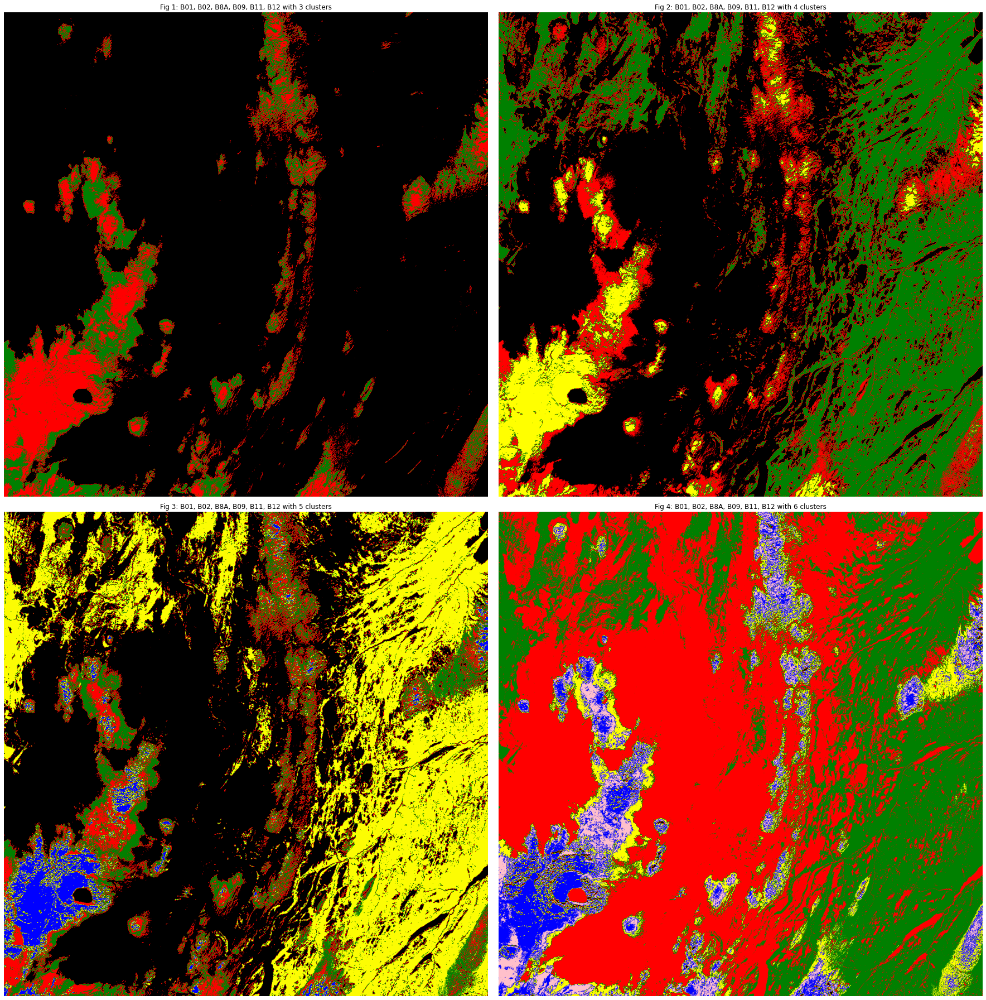

In [7]:
selected_bands1 = [B01, B02, B8A, B09, B11, B12]

img_cl1 = kmeans(selected_bands1,3)
img_cl2 = kmeans(selected_bands1,4)
img_cl3 = kmeans(selected_bands1,5)
img_cl4 = kmeans(selected_bands1,6)

cmap1 = colors.LinearSegmentedColormap.from_list("", ["black","red","green"])
cmap2 = colors.LinearSegmentedColormap.from_list("", ["black","red","green","yellow"])
cmap3 = colors.LinearSegmentedColormap.from_list("", ["black","red","green","yellow","blue"])
cmap4 = colors.LinearSegmentedColormap.from_list("", ["black","red","green","yellow","blue","pink"])

fig = plt.figure(figsize=[25,25])
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)

ax1.imshow(img_cl1,cmap=cmap1)
ax1.set_title('Fig 1: B01, B02, B8A, B09, B11, B12 with 3 clusters')
ax2.imshow(img_cl2,cmap=cmap2)
ax2.set_title('Fig 2: B01, B02, B8A, B09, B11, B12 with 4 clusters')
ax3.imshow(img_cl3,cmap=cmap3)
ax3.set_title('Fig 3: B01, B02, B8A, B09, B11, B12 with 5 clusters')
ax4.imshow(img_cl4,cmap=cmap4)
ax4.set_title('Fig 4: B01, B02, B8A, B09, B11, B12 with 6 clusters')

ax1.axis('off')
ax2.axis('off')
ax3.axis('off')
ax4.axis('off')

plt.tight_layout()
plt.show()

Using B01, B02, B8A, B09, B11 and B12 yields similiar results as using all 11 bands. Figure 1, with 3 clusters, also have two classes for snow and the greyish brown and dark brownish red are combined into one. Figure 2, with 4 clusters, split the greyish brown and dark brownish red into two classes. But the snow still has multiple classes, with the edges being the same class as the dark brownish red. And figure 3 and 4, 5 clusters and 6 clusters, the snow, greyish brown and dark brownish red are again subdivided into more classes. But there is still no distinctive class for the water.

Different combinations and amount of bands were used, but (almost) all of them yielded the same results as using all 11 bands. Two of these aforementioned combinations are shown below. B09 with B11, which has the lowest correlation: 0.04. And B01, B12, which has a negative correlation of -0.50.

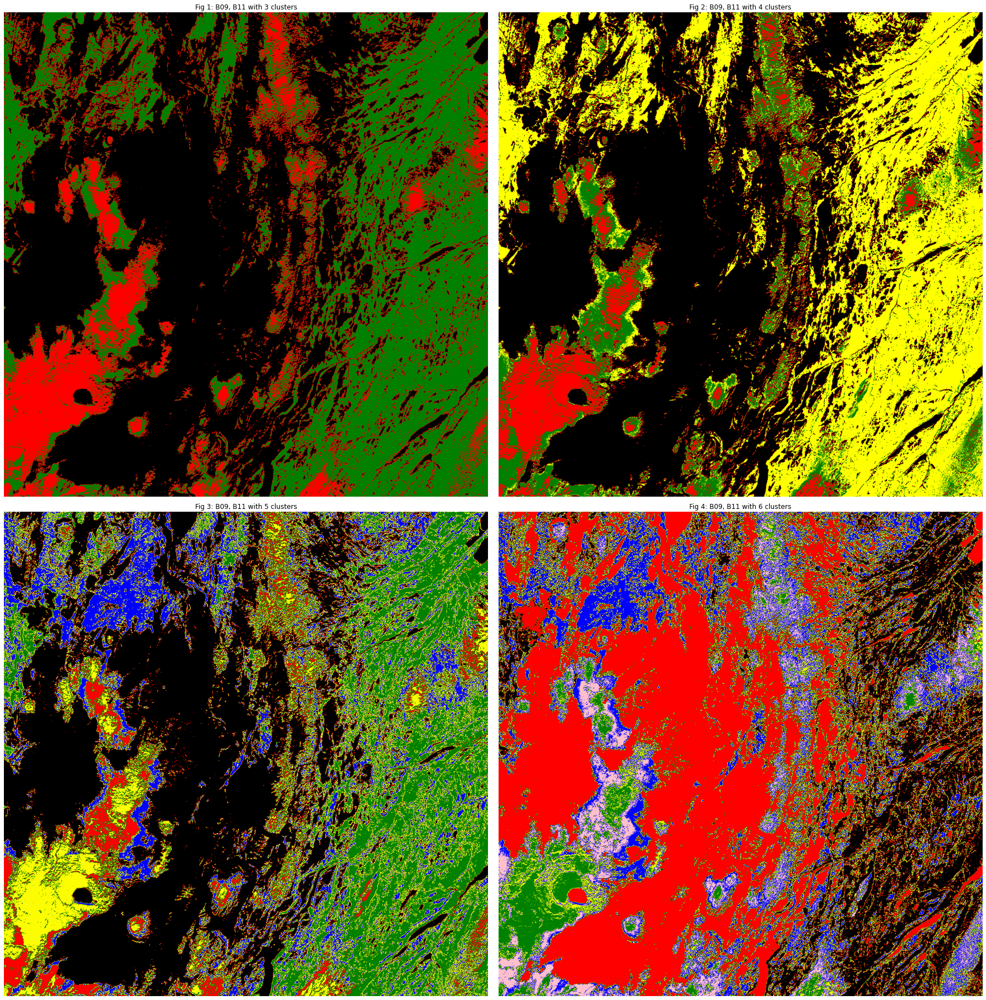

In [8]:
selected_bands2 = [B09, B11]

img_cl1 = kmeans(selected_bands2,3)
img_cl2 = kmeans(selected_bands2,4)
img_cl3 = kmeans(selected_bands2,5)
img_cl4 = kmeans(selected_bands2,6)

cmap1 = colors.LinearSegmentedColormap.from_list("", ["black","red","green"])
cmap2 = colors.LinearSegmentedColormap.from_list("", ["black","red","green","yellow"])
cmap3 = colors.LinearSegmentedColormap.from_list("", ["black","red","green","yellow","blue"])
cmap4 = colors.LinearSegmentedColormap.from_list("", ["black","red","green","yellow","blue","pink"])

fig = plt.figure(figsize=[25,25])
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)

ax1.imshow(img_cl1,cmap=cmap1)
ax1.set_title('Fig 1: B09, B11 with 3 clusters')
ax2.imshow(img_cl2,cmap=cmap2)
ax2.set_title('Fig 2: B09, B11 with 4 clusters')
ax3.imshow(img_cl3,cmap=cmap3)
ax3.set_title('Fig 3: B09, B11 with 5 clusters')
ax4.imshow(img_cl4,cmap=cmap4)
ax4.set_title('Fig 4: B09, B11 with 6 clusters')

ax1.axis('off')
ax2.axis('off')
ax3.axis('off')
ax4.axis('off')

plt.tight_layout()
plt.show()

Using B09 and B11 yields the same results as using all 11 bands and using B01, B02, B8A, B09, B11 and B12.

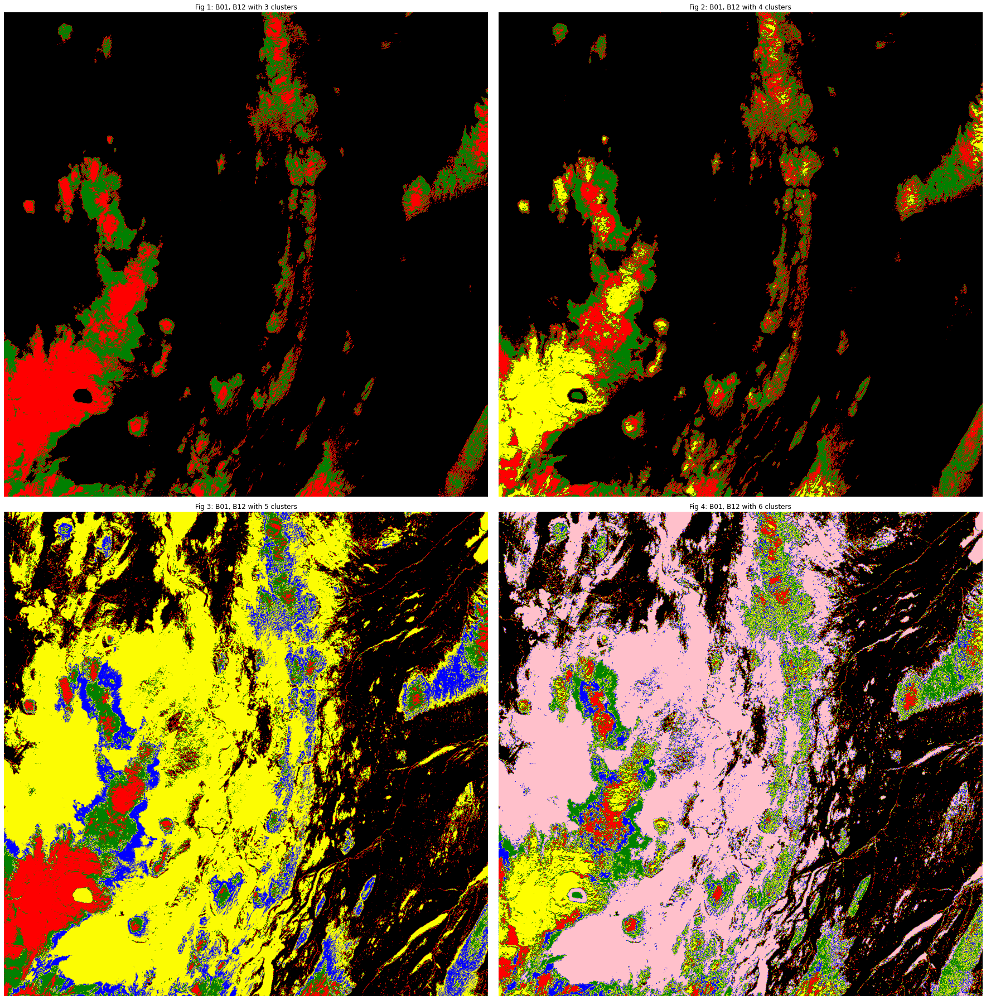

In [9]:
selected_bands3 = [B01, B12]

img_cl1 = kmeans(selected_bands3,3)
img_cl2 = kmeans(selected_bands3,4)
img_cl3 = kmeans(selected_bands3,5)
img_cl4 = kmeans(selected_bands3,6)

cmap1 = colors.LinearSegmentedColormap.from_list("", ["black","red","green"])
cmap2 = colors.LinearSegmentedColormap.from_list("", ["black","red","green","yellow"])
cmap3 = colors.LinearSegmentedColormap.from_list("", ["black","red","green","yellow","blue"])
cmap4 = colors.LinearSegmentedColormap.from_list("", ["black","red","green","yellow","blue","pink"])

fig = plt.figure(figsize=[25,25])
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)

ax1.imshow(img_cl1,cmap=cmap1)
ax1.set_title('Fig 1: B01, B12 with 3 clusters')
ax2.imshow(img_cl2,cmap=cmap2)
ax2.set_title('Fig 2: B01, B12 with 4 clusters')
ax3.imshow(img_cl3,cmap=cmap3)
ax3.set_title('Fig 3: B01, B12 with 5 clusters')
ax4.imshow(img_cl4,cmap=cmap4)
ax4.set_title('Fig 4: B01, B12 with 6 clusters')

ax1.axis('off')
ax2.axis('off')
ax3.axis('off')
ax4.axis('off')

plt.tight_layout()
plt.show()

Using B01 and B12 again gives the same results as the previous used combinations of bands, the only difference here is that the distinction between the greyish brown and dark brownish red is made when 5 clusters are used instead of 4. Although also here the water has not been distinguised.

In [25]:
def appnclusters(bands):
    imgxyb = np.empty((bands[0].height, bands[0].width, len(bands)), bands[0].meta['dtype'])
    for i in range(len(bands)):
        imgxyb[:,:,i] = bands[i].read()

    img1d = imgxyb.reshape((imgxyb.shape[0]*imgxyb.shape[1],imgxyb.shape[2]))

    sse = []
    for k in range(1,6):
        cl = cluster.KMeans(n_clusters=k)
        cl.fit(img1d)
        sse.append(cl.inertia_)

    plt.style.use('fivethirtyeight')
    plt.plot(range(1, 6), sse)
    plt.xticks(range(1, 6))
    plt.xlabel('Number of Clusters')
    plt.ylabel('SSE')
    plt.show()

    kl = KneeLocator(range(1, 6), sse, curve='convex', direction='decreasing')
    print('Appropriate amount of Clusters: {}'.format(kl.elbow))

With the above function the appropriate number of clusters can be evaluated. The function runs several k-means, increment the clusters *k* and records the SSE (sum of the squared error). The sweet point where the SSE curve starts to bend is then found with the elbow method.

Though seeing that the snow, which we see as one class, already get subdivided into several classes with 3 clusters and the land and water are not distinquished. I do not expect a good evaluation of the appropriate number of clusters.

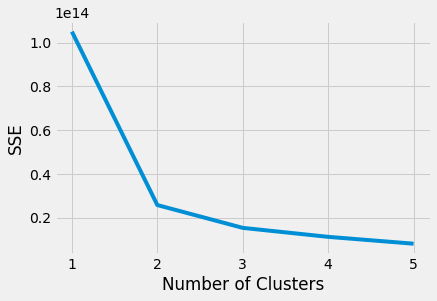

Appropriate amount of Clusters: 2


In [20]:
appnclusters(all_bands)

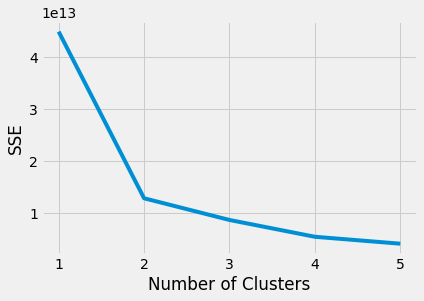

Appropriate amount of Clusters: 2


In [21]:
appnclusters(selected_bands1)

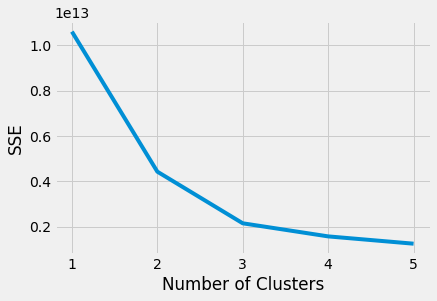

Appropriate amount of Clusters: 2


In [22]:
appnclusters(selected_bands2)

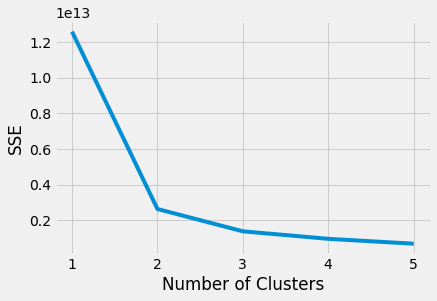

Appropriate amount of Clusters: 2


In [23]:
appnclusters(selected_bands3)

As expected the function evaluated for the previous used combinations of bands an appropriate amount of clusters of 2. As seen in the results above the snow already gets subdivided into two classes with 3 clusters.

The results of the classification using the appropriate amount of clusters and the previous used combination of bands are shown below.

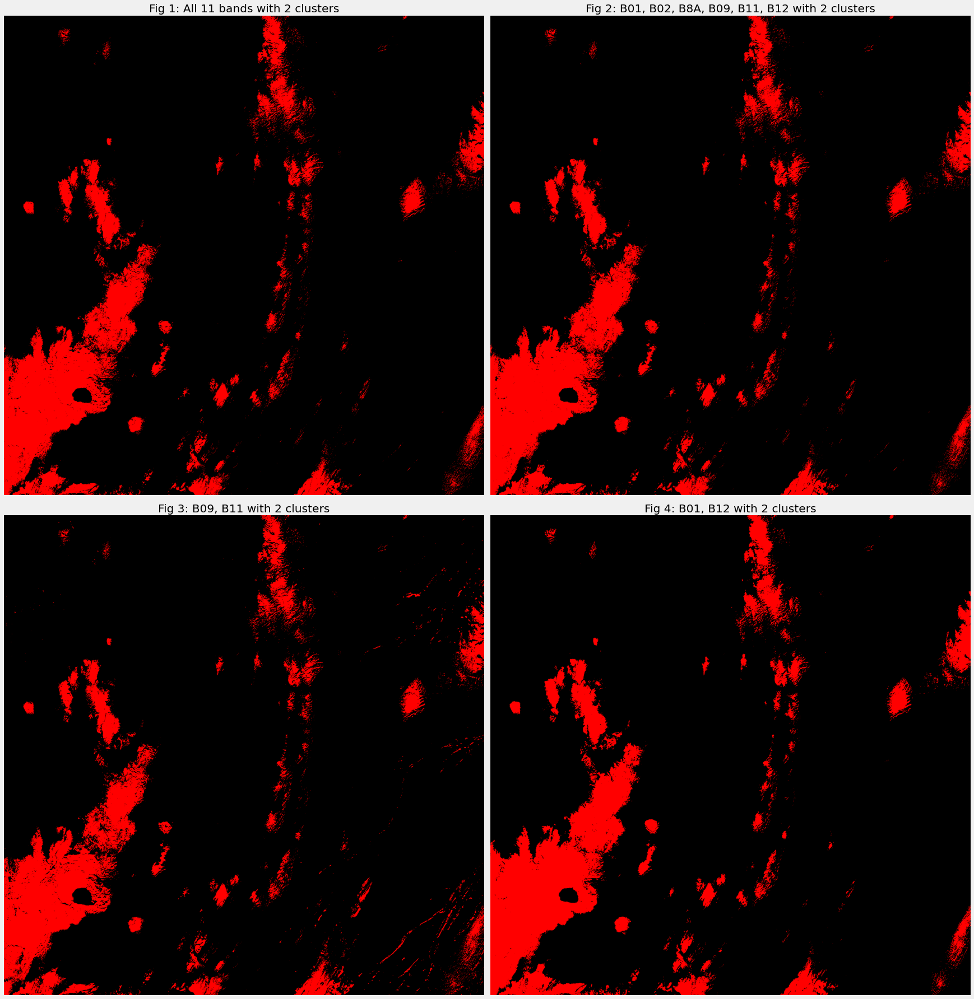

In [26]:
img_cl1 = kmeans(all_bands,2)
img_cl2 = kmeans(selected_bands1,2)
img_cl3 = kmeans(selected_bands2,2)
img_cl4 = kmeans(selected_bands3,2)

cmap1 = colors.LinearSegmentedColormap.from_list("", ["black","red"])

fig = plt.figure(figsize=[25,25])
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)

ax1.imshow(img_cl1,cmap=cmap1)
ax1.set_title('Fig 1: All 11 bands with 2 clusters')
ax2.imshow(img_cl2,cmap=cmap1)
ax2.set_title('Fig 2: B01, B02, B8A, B09, B11, B12 with 2 clusters')
ax3.imshow(img_cl3,cmap=cmap1)
ax3.set_title('Fig 3: B09, B11 with 2 clusters')
ax4.imshow(img_cl4,cmap=cmap1)
ax4.set_title('Fig 4: B01, B12 with 2 clusters')

ax1.axis('off')
ax2.axis('off')
ax3.axis('off')
ax4.axis('off')

plt.tight_layout()
plt.show()

### Conclusion

Using the following combinations of bands yielded the "best" results:
- all bands with 4 clusters;
- B01, B02, B8A, B09, B11 and B12 with 4 clusters;
- B09 and B11 with 4 clusters;
- B01, B12 with 5 clusters.

The results are far from good though, since the distinction between land and water cannot be made without fragmenting the snow cover. Let alone making a distinction between different types of land cover. The appropriate amount of clusters was evaluated at 2, which already subdivided the snow into two classes. Which leads me to believe that the snow cover is the reason the results of the classification are lacking. This would also explain why the correlation of the bands are so high, since snow reflects almost all of the light, hence why it is pure white. And it also explains why by increasing the amount of clusters the snow gets subdivided into more classes.

Also seeing how the elbow method evaluated the number of clusters to 2 and seeing how the TCI has atleast 4 land cover types: snow, water, land and vegetation, represented by 4 cleary observable different colors, leads me to believe that supervised classification is needed to classify images with snow cover.

**Pros**:
By using k-means clustering several results with different combinations of bands and number of clusters are generated quickly, which makes it easy to compare the different results. Also the proven methods, like the correlation between bands and the elbow method to find the right amount of clusters, can help a lot with this process.

**Cons**:
The results however showed that the k-means is not able to classify images entirely with the presence of snow cover. It is suspected that the snow influences the results of the classification, because snow reflects almost all of the light. This can be seen in the correlation matrix, which showed a high correlation between the bands for most of the combination of bands. This in turn cause the elbow method to give an appropriate amount of clusters of 2, which only made a distinction between snow and everything else.